# VDM Model Variants Comparison

This notebook compares 6 VDM model variants trained with different techniques:

| Model | Key Difference | Hypothesis |
|-------|---------------|------------|
| **Baseline** | Standard regularized VDM | Reference model |
| **Halo Mass** | log10(halo_mass) as 36th conditioning param | Better generalization to different halo masses |
| **Bijective** | Bijective training dataset (1:1 DMO↔Hydro matching) | More consistent training pairs |
| **Cosmo Norm** | Divide fields by Ωm/Ωb before log transform | Remove first-order cosmology dependence |
| **Gas & Star** | Stronger param_prediction_weight + baryon fraction loss | Better cosmology→baryon relationship |
| **Strong FiLM** | film_init_std=0.1 (10x higher) | Stronger cosmology-dependent modulation |

## Goals:
1. Visual comparison on random halos
2. Training loss curve analysis
3. Quantitative metrics (MSE, correlation, SSIM)
4. Decide which techniques to combine

In [1]:
import sys
sys.path.insert(0, '/mnt/home/mlee1/vdm_BIND')

import torch
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
from scipy.stats import pearsonr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm
import joblib

from bind.config_loader import ConfigLoader
from bind.model_manager import ModelManager
from bind.sampling import sample
from vdm.astro_dataset import get_astro_data
from analysis.paper_utils import setup_plotting_style

setup_plotting_style()
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {DEVICE}")

/mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/mnt/sw/nix/store/6qvrglgqdpwhbw9zv2nh07fpd7a4wq31-py-torchvision-0.15.2/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


Using device: cuda


## 1. Model Configuration

In [2]:
# VDM Model variants to compare
# Format: {display_name: (config_path, uses_cosmo_norm, description)}
VDM_MODELS = {
    'Baseline': (
        '/mnt/home/mlee1/vdm_BIND/configs/clean_vdm_regularized.ini',
        False,
        'Standard regularized VDM (dropout=0.1, weight_decay=1e-4)'
    ),
    'Halo Mass': (
        '/mnt/home/mlee1/vdm_BIND/configs/clean_vdm_halo_mass.ini',
        False,
        'Adds log10(halo_mass) as 36th conditioning parameter'
    ),
    'Bijective': (
        '/mnt/home/mlee1/vdm_BIND/configs/clean_vdm_regularized_bijective.ini',
        False,
        'Trained on bijective dataset (1:1 DMO↔Hydro matching)'
    ),
    'Cosmo Norm': (
        '/mnt/home/mlee1/vdm_BIND/configs/clean_vdm_cosmo_norm.ini',
        True,
        'Divides fields by Ωm/Ωb before log transform'
    ),
    'Gas & Star': (
        '/mnt/home/mlee1/vdm_BIND/configs/clean_vdm_gas_and_star.ini',
        False,
        'Stronger param_prediction_weight (0.1) + baryon fraction loss'
    ),
    'Strong FiLM': (
        '/mnt/home/mlee1/vdm_BIND/configs/clean_vdm_strong_film.ini',
        False,
        'FiLM init std=0.1 (10x higher for stronger conditioning)'
    ),
}

CHANNEL_NAMES = ['Hydro DM', 'Gas', 'Stars']

# Verify all models have checkpoints
print("="*70)
print("VDM MODEL VARIANTS - CHECKPOINT STATUS")
print("="*70)
for name, (cfg_path, uses_cosmo, desc) in VDM_MODELS.items():
    try:
        config = ConfigLoader(cfg_path, verbose=False)
        ckpt = config.best_ckpt
        if ckpt:
            ckpt_name = Path(ckpt).name
            print(f"✓ {name:12s}: {ckpt_name}")
            print(f"              {desc}")
        else:
            print(f"✗ {name:12s}: NO CHECKPOINT")
    except Exception as e:
        print(f"✗ {name:12s}: ERROR - {e}")

VDM MODEL VARIANTS - CHECKPOINT STATUS


2025-12-23 12:06:16.367034: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-23 12:06:16.808728: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX512F AVX512_VNNI, in other operations, rebuild TensorFlow with the appropriate compiler flags.


✓ Baseline    : epoch-epoch=189-step=121410.ckpt
              Standard regularized VDM (dropout=0.1, weight_decay=1e-4)
✓ Halo Mass   : latest-epoch=150-step=96000.ckpt
              Adds log10(halo_mass) as 36th conditioning parameter
✓ Bijective   : epoch-epoch=119-step=74400.ckpt
              Trained on bijective dataset (1:1 DMO↔Hydro matching)
✓ Cosmo Norm  : latest-epoch=150-step=96000.ckpt
              Divides fields by Ωm/Ωb before log transform
✓ Gas & Star  : latest-epoch=150-step=96000.ckpt
              Stronger param_prediction_weight (0.1) + baryon fraction loss
✓ Strong FiLM : latest-epoch=150-step=96000.ckpt
              FiLM init std=0.1 (10x higher for stronger conditioning)


## 2. Unnormalization Utilities

To fairly compare models with different normalizations, we unnormalize all outputs to physical space.

In [3]:
class FieldUnnormalizer:
    """
    Handles unnormalization for both standard and cosmo_norm schemes.
    
    Normalization pipeline during training:
    - DM & Gas: log10(field + 1) → Z-score normalize
    - Stellar: log10(field + 1) → QuantileTransform to [0,1] (NO Z-score!)
    - Cosmo norm adds: field / Omega BEFORE log transform
    
    Unnormalization (reverse):
    - DM & Gas: Z-score denorm → 10^x - 1
    - Stellar: QuantileInverse → 10^x - 1
    - Cosmo norm adds: multiply by Omega AFTER linear transform
    """
    
    STATS_PATHS = {
        'standard': {
            'dm': '/mnt/home/mlee1/vdm_BIND/data/dark_matter_normalization_stats.npz',
            'gas': '/mnt/home/mlee1/vdm_BIND/data/gas_normalization_stats.npz',
        },
        'cosmo_norm': {
            'dm': '/mnt/home/mlee1/vdm_BIND/data/cosmo_norm_dark_matter_stats.npz',
            'gas': '/mnt/home/mlee1/vdm_BIND/data/cosmo_norm_gas_stats.npz',
        }
    }
    
    QUANTILE_PATHS = {
        'standard': '/mnt/home/mlee1/vdm_BIND/data/quantile_normalizer_stellar.pkl',
        'cosmo_norm': '/mnt/home/mlee1/vdm_BIND/data/cosmo_norm_quantile_normalizer_stellar.pkl',
    }
    
    def __init__(self, cosmo_norm=False):
        self.cosmo_norm = cosmo_norm
        norm_type = 'cosmo_norm' if cosmo_norm else 'standard'
        
        # Load stats from files
        dm_stats = np.load(self.STATS_PATHS[norm_type]['dm'])
        gas_stats = np.load(self.STATS_PATHS[norm_type]['gas'])
        
        self.mean_dm_gas = np.array([
            float(dm_stats['dm_mag_mean']), 
            float(gas_stats['gas_mag_mean']),
        ])
        self.std_dm_gas = np.array([
            float(dm_stats['dm_mag_std']), 
            float(gas_stats['gas_mag_std']),
        ])
        
        # Load quantile transformer for stellar channel
        quantile_path = self.QUANTILE_PATHS[norm_type]
        if Path(quantile_path).exists():
            self.quantile_transformer = joblib.load(quantile_path)
        else:
            self.quantile_transformer = None
            print(f"⚠️ Quantile transformer not found: {quantile_path}")
    
    def unnormalize(self, pred, params=None):
        """Unnormalize predictions to physical linear space."""
        unnorm = np.zeros_like(pred)
        
        # DM and Gas - reverse Z-score
        mean = self.mean_dm_gas.reshape(-1, 1, 1)
        std = self.std_dm_gas.reshape(-1, 1, 1)
        unnorm[:2] = pred[:2] * std + mean
        
        # Stellar - reverse quantile transform
        if self.quantile_transformer is not None:
            stellar = pred[2]
            original_shape = stellar.shape
            stellar_flat = np.clip(stellar.reshape(-1, 1), 0, 1)
            stellar_log = self.quantile_transformer.inverse_transform(stellar_flat)
            unnorm[2] = stellar_log.reshape(original_shape)
        else:
            unnorm[2] = pred[2]
        
        # Reverse log transform: linear = 10^log - 1
        unnorm = 10**unnorm - 1.0
        unnorm = np.maximum(unnorm, 0)
        
        # Reverse cosmo_norm division
        if self.cosmo_norm and params is not None:
            omega_m = params[0]
            omega_b = params[6]
            unnorm[0] *= omega_m
            unnorm[1] *= omega_b
            unnorm[2] *= omega_b
        
        return unnorm

# Create unnormalizers
unnorm_standard = FieldUnnormalizer(cosmo_norm=False)
unnorm_cosmo = FieldUnnormalizer(cosmo_norm=True)
print("✅ Unnormalizers ready")

✅ Unnormalizers ready


/mnt/home/mlee1/venvs/torch3/lib/python3.10/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.2.2 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


## 3. Load Test Data

Load test data for both normalization schemes.

In [4]:
test_root = '/mnt/home/mlee1/ceph/train_data_rotated2_128_cpu/test/'

# Standard normalization dataloader
datamodule_standard = get_astro_data(
    'IllustrisTNG', test_root, batch_size=4, num_workers=4, stage='test',
    quantile_path='/mnt/home/mlee1/vdm_BIND/data/quantile_normalizer_stellar.pkl',
    include_halo_mass=True, cosmo_norm=False,
)
datamodule_standard.setup(stage='test')

# Cosmo-norm dataloader
datamodule_cosmo = get_astro_data(
    'IllustrisTNG', test_root, batch_size=4, num_workers=4, stage='test',
    quantile_path='/mnt/home/mlee1/vdm_BIND/data/cosmo_norm_quantile_normalizer_stellar.pkl',
    dm_stats_path='/mnt/home/mlee1/vdm_BIND/data/cosmo_norm_dark_matter_stats.npz',
    gas_stats_path='/mnt/home/mlee1/vdm_BIND/data/cosmo_norm_gas_stats.npz',
    include_halo_mass=True, cosmo_norm=True,
)
datamodule_cosmo.setup(stage='test')

# Get datasets
dataset_standard = datamodule_standard.test_dataloader().dataset
dataset_cosmo = datamodule_cosmo.test_dataloader().dataset

print(f"✅ Loaded {len(dataset_standard)} test halos")

✓ Loaded DM stats from dark_matter_normalization_stats.npz: mean=9.915499, std=0.467967
✓ Loaded Gas stats from gas_normalization_stats.npz: mean=9.177344, std=0.410510
✓ Loading quantile transformer from: /mnt/home/mlee1/vdm_BIND/data/quantile_normalizer_stellar.pkl
  Quantile transformer loaded (n_quantiles=10000)
  Output distribution: uniform

📊 NORMALIZATION CONFIG (3-channel mode):
  DM input: mean=9.9777, std=0.4139
  DM target: mean=9.9155, std=0.4680
  Gas target: mean=9.1773, std=0.4105
  Stars target: QUANTILE TRANSFORMATION (n_quantiles=10000)
✓ Loaded DM stats from dark_matter_normalization_stats.npz: mean=9.915499, std=0.467967
✓ Loaded Gas stats from gas_normalization_stats.npz: mean=9.177344, std=0.410510
✓ Loading quantile transformer from: /mnt/home/mlee1/vdm_BIND/data/quantile_normalizer_stellar.pkl
  Quantile transformer loaded (n_quantiles=10000)
  Output distribution: uniform

📊 NORMALIZATION CONFIG (3-channel mode):
  DM input: mean=9.9777, std=0.4139
  DM target

## 4. Visual Comparison: Random Halos

Generate samples for a handful of random halos and compare visually.

In [5]:
# Select random halos for visual comparison
np.random.seed(42)
N_VISUAL_HALOS = 5
total_halos = len(dataset_standard)
visual_indices = np.random.choice(total_halos, size=N_VISUAL_HALOS, replace=False)
print(f"Selected halo indices for visualization: {visual_indices}")

Selected halo indices for visualization: [23414 33222 21723 27400  9195]


In [6]:
# Load all models and generate samples for visual comparison
def get_halo_data(idx, cosmo_norm):
    """Get data for a halo with appropriate normalization."""
    dataset = dataset_cosmo if cosmo_norm else dataset_standard
    cond, large_scale, target, params = dataset[idx]
    full_cond = torch.cat([cond.unsqueeze(0), large_scale.unsqueeze(0)], dim=1)
    return full_cond, target, params.unsqueeze(0)

# Store samples: {model_name: {halo_idx: (pred_physical, target_physical)}}
all_samples = {name: {} for name in VDM_MODELS}

for model_name, (config_path, uses_cosmo_norm, desc) in VDM_MODELS.items():
    print(f"\n{'='*60}")
    print(f"Loading {model_name}...")
    
    try:
        config = ConfigLoader(config_path, verbose=False)
        if config.best_ckpt is None:
            print(f"⚠️ No checkpoint found")
            continue
            
        _, model = ModelManager.initialize(config, verbose=False, skip_data_loading=True)
        model = model.to(DEVICE).eval()
        
        unnormalizer = unnorm_cosmo if uses_cosmo_norm else unnorm_standard
        needs_halo_mass = getattr(config, 'include_halo_mass', False)
        
        for idx in visual_indices:
            full_cond, target, params = get_halo_data(idx, uses_cosmo_norm)
            
            sample_params = params.numpy() if needs_halo_mass else params[:, :-1].numpy()
            
            with torch.no_grad():
                s = sample(model, full_cond, batch_size=1, conditional_params=sample_params)
                pred_norm = s[0, 0].cpu().numpy()
            
            pred_phys = unnormalizer.unnormalize(pred_norm.copy(), params[0].numpy())
            targ_phys = unnormalizer.unnormalize(target.numpy().copy(), params[0].numpy())
            
            all_samples[model_name][idx] = (pred_phys, targ_phys)
        
        print(f"✓ Generated {len(visual_indices)} samples")
        del model
        torch.cuda.empty_cache()
        
    except Exception as e:
        print(f"❌ Error: {e}")
        import traceback
        traceback.print_exc()


Loading Baseline...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.01)




Generating Samples (250 steps): 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


✓ Generated 5 samples

Loading Halo Mass...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=36)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 36 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.01)




Generating Samples (250 steps): 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


✓ Generated 5 samples

Loading Bijective...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.01)




Generating Samples (250 steps): 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


✓ Generated 5 samples

Loading Cosmo Norm...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.01)




Generating Samples (250 steps): 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


✓ Generated 5 samples

Loading Gas & Star...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.1)

🌌 BARYON FRACTION LOSS enabled (weight=0.1)
   This encourages pred

Generating Samples (250 steps): 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


✓ Generated 5 samples

Loading Strong FiLM...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.1)

🌌 BARYON FRACTION LOSS enabled (weight=0.1)
   This encourages pred

Generating Samples (250 steps): 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]

✓ Generated 5 samples


/tmp/ipykernel_492863/3409023389.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


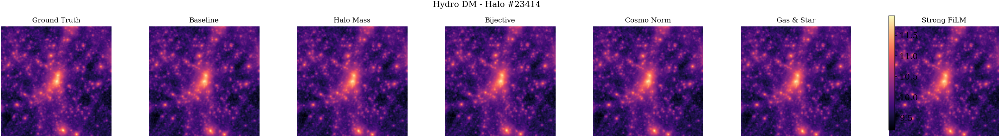

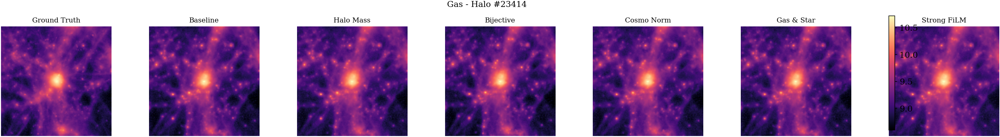

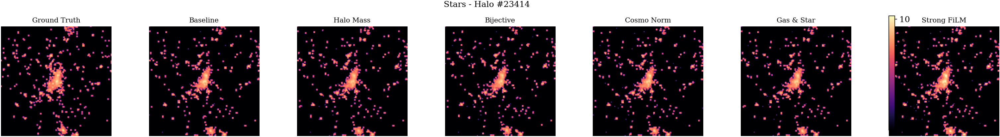

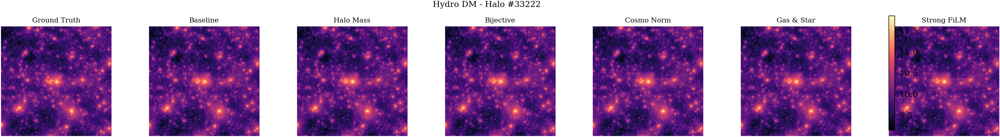

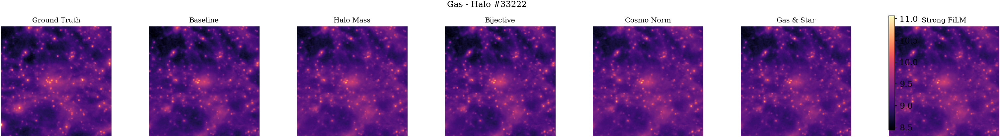

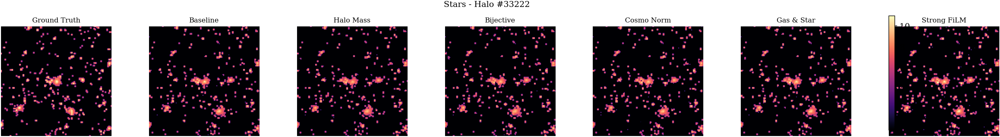

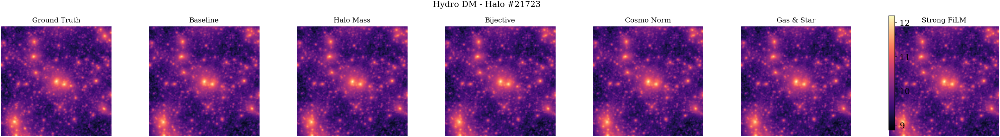

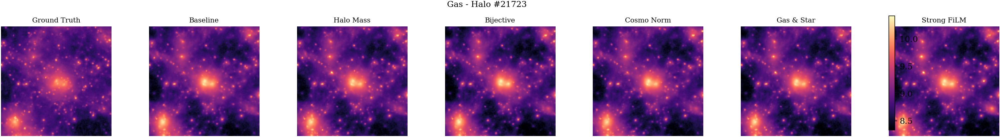

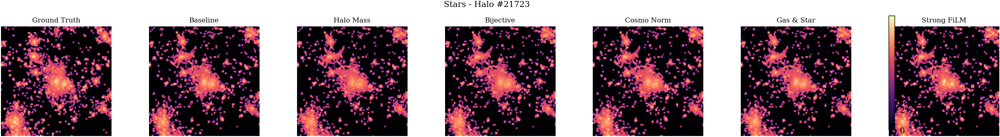

In [7]:
# Visualize: Ground Truth + All Models for each halo (one channel at a time)
def plot_halo_comparison(halo_idx, channel_idx, channel_name):
    """Plot comparison for a single halo and channel."""
    models_with_data = [name for name in VDM_MODELS if halo_idx in all_samples[name]]
    n_models = len(models_with_data)
    
    fig, axes = plt.subplots(1, n_models + 1, figsize=(3*(n_models+1), 3))
    
    # Get ground truth from first available model
    _, targ_phys = all_samples[models_with_data[0]][halo_idx]
    gt = np.log10(targ_phys[channel_idx] + 1)
    vmin, vmax = gt.min(), gt.max()
    
    # Ground truth
    im = axes[0].imshow(gt, cmap='magma', vmin=vmin, vmax=vmax)
    axes[0].set_title('Ground Truth', fontsize=10)
    axes[0].axis('off')
    
    # Each model
    for i, name in enumerate(models_with_data):
        pred_phys, _ = all_samples[name][halo_idx]
        pred_log = np.log10(np.maximum(pred_phys[channel_idx], 0) + 1)
        axes[i+1].imshow(pred_log, cmap='magma', vmin=vmin, vmax=vmax)
        axes[i+1].set_title(name, fontsize=10)
        axes[i+1].axis('off')
    
    plt.colorbar(im, ax=axes, fraction=0.02, pad=0.02)
    plt.suptitle(f'{channel_name} - Halo #{halo_idx}', fontsize=12)
    plt.tight_layout()
    return fig

# Plot comparisons for first 3 halos, all channels
for halo_idx in visual_indices[:3]:
    for ch_idx, ch_name in enumerate(CHANNEL_NAMES):
        fig = plot_halo_comparison(halo_idx, ch_idx, ch_name)
        plt.show()
        plt.close()

## 5. Training Loss Curves

Compare training progress using TensorBoard logs.

In [8]:
from tensorboard.backend.event_processing import event_accumulator

def load_tensorboard_scalars(log_dir, tags=None):
    """Load scalar metrics from TensorBoard logs."""
    ea = event_accumulator.EventAccumulator(str(log_dir))
    ea.Reload()
    
    available_tags = ea.Tags().get('scalars', [])
    if tags is None:
        tags = available_tags
    
    data = {}
    for tag in tags:
        if tag in available_tags:
            events = ea.Scalars(tag)
            data[tag] = {
                'steps': [e.step for e in events],
                'values': [e.value for e in events]
            }
    return data

# Map model names to TensorBoard log directories
TB_LOGS = Path('/mnt/home/mlee1/ceph/tb_logs3')
MODEL_LOG_DIRS = {
    'Baseline': 'clean_vdm_regularized',
    'Halo Mass': 'clean_vdm_halo_mass',
    'Bijective': 'clean_vdm_bijective',
    'Cosmo Norm': 'clean_vdm_cosmo_norm',
    'Gas & Star': 'clean_vdm_gas_and_star',
    'Strong FiLM': 'clean_vdm_strong_film',
}

# Load training metrics
training_data = {}
for name, log_dir in MODEL_LOG_DIRS.items():
    log_path = TB_LOGS / log_dir / 'version_0'
    if log_path.exists():
        try:
            data = load_tensorboard_scalars(log_path)
            training_data[name] = data
            print(f"✓ {name}: {len(data)} metrics loaded")
        except Exception as e:
            print(f"⚠️ {name}: {e}")
    else:
        # Try alternate path patterns
        alt_paths = list(TB_LOGS.glob(f'{log_dir}*/version_0'))
        if alt_paths:
            try:
                data = load_tensorboard_scalars(alt_paths[0])
                training_data[name] = data
                print(f"✓ {name}: {len(data)} metrics loaded (from {alt_paths[0].parent.name})")
            except Exception as e:
                print(f"⚠️ {name}: {e}")
        else:
            print(f"✗ {name}: log path not found")

✓ Baseline: 55 metrics loaded
✓ Halo Mass: 55 metrics loaded
✗ Bijective: log path not found
✓ Cosmo Norm: 58 metrics loaded
✓ Gas & Star: 73 metrics loaded
✓ Strong FiLM: 73 metrics loaded


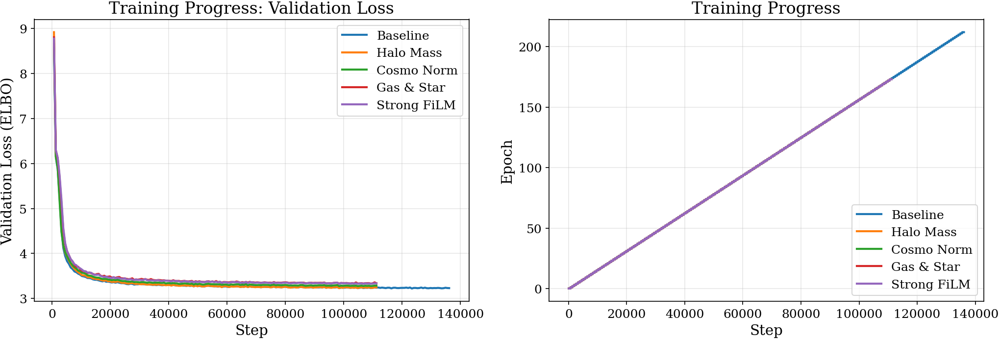

In [9]:
# Plot validation loss curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Left: Validation ELBO (main loss)
ax = axes[0]
for name, data in training_data.items():
    for loss_key in ['val/elbo', 'val/loss', 'val/diffusion_loss']:
        if loss_key in data:
            steps = data[loss_key]['steps']
            values = data[loss_key]['values']
            ax.plot(steps, values, label=name, linewidth=2)
            break
ax.set_xlabel('Step')
ax.set_ylabel('Validation Loss (ELBO)')
ax.set_title('Training Progress: Validation Loss')
ax.legend(loc='upper right')
ax.grid(True, alpha=0.3)

# Right: Per-channel losses if available
ax = axes[1]
channel_loss_keys = ['val/loss_ch0', 'val/loss_ch1', 'val/loss_ch2', 
                     'val/dm_loss', 'val/gas_loss', 'val/star_loss']
has_channel_data = False
for name, data in training_data.items():
    for key in channel_loss_keys:
        if key in data:
            has_channel_data = True
            steps = data[key]['steps']
            values = data[key]['values']
            ax.plot(steps, values, label=f'{name} - {key.split("/")[-1]}', linewidth=1, alpha=0.7)

if has_channel_data:
    ax.set_xlabel('Step')
    ax.set_ylabel('Per-Channel Loss')
    ax.set_title('Per-Channel Validation Losses')
    ax.legend(loc='upper right', fontsize=8)
    ax.grid(True, alpha=0.3)
else:
    # Plot epochs instead
    for name, data in training_data.items():
        if 'epoch' in data:
            steps = data['epoch']['steps']
            epochs = data['epoch']['values']
            ax.plot(steps, epochs, label=name, linewidth=2)
    ax.set_xlabel('Step')
    ax.set_ylabel('Epoch')
    ax.set_title('Training Progress')
    ax.legend(loc='lower right')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('vdm_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

In [10]:
# Training summary table
summary_rows = []
for name, data in training_data.items():
    row = {'Model': name}
    
    for loss_key in ['val/elbo', 'val/loss', 'val/diffusion_loss']:
        if loss_key in data and data[loss_key]['values']:
            row['Final Val Loss'] = data[loss_key]['values'][-1]
            row['Best Val Loss'] = min(data[loss_key]['values'])
            break
    
    if 'epoch' in data and data['epoch']['values']:
        row['Epochs'] = int(max(data['epoch']['values']))
    
    for key in data:
        if data[key]['steps']:
            row['Steps'] = max(data[key]['steps'])
            break
    
    summary_rows.append(row)

if summary_rows:
    summary_df = pd.DataFrame(summary_rows).set_index('Model')
    print("📊 Training Summary:")
    print(summary_df.round(4).to_string())
else:
    print("No training data available")

📊 Training Summary:
             Final Val Loss  Best Val Loss  Epochs  Steps
Model                                                    
Baseline             3.2303         3.2216     212      0
Halo Mass            3.2466         3.2294     173      0
Cosmo Norm           3.2852         3.2738     173      0
Gas & Star           3.3391         3.3298     173      0
Strong FiLM          3.3344         3.3229     173      0


## 6. Quantitative Evaluation: Multi-Halo Metrics

Evaluate all models on a larger set of halos with MSE, correlation, and SSIM metrics.

In [11]:
# Configuration for multi-halo evaluation
N_EVAL_HALOS = 50
N_SAMPLING_STEPS = 250

# Select random indices for evaluation
np.random.seed(123)
eval_indices = np.random.choice(len(dataset_standard), size=N_EVAL_HALOS, replace=False)
print(f"Evaluating on {N_EVAL_HALOS} randomly selected halos")

Evaluating on 50 randomly selected halos


In [12]:
def compute_metrics_physical(pred_phys, target_phys):
    """Compute MSE, correlation, SSIM in physical (log) space."""
    metrics = {}
    for ch, ch_name in enumerate(CHANNEL_NAMES):
        gt = target_phys[ch]
        pr = pred_phys[ch]
        
        # Log space
        gt_log = np.log10(gt + 1)
        pr_log = np.log10(np.maximum(pr, 0) + 1)
        
        # MSE in log space
        mse = np.mean((gt_log - pr_log)**2)
        
        # Pearson correlation
        corr, _ = pearsonr(gt_log.flatten(), pr_log.flatten())
        
        # SSIM
        data_range = max(gt_log.max() - gt_log.min(), pr_log.max() - pr_log.min())
        if data_range > 0:
            ssim_val = ssim(gt_log, pr_log, data_range=data_range)
        else:
            ssim_val = 1.0
        
        metrics[f'{ch_name}_MSE'] = mse
        metrics[f'{ch_name}_Corr'] = corr
        metrics[f'{ch_name}_SSIM'] = ssim_val
    
    return metrics

# Evaluate all models
all_results = {name: [] for name in VDM_MODELS}

for model_name, (config_path, uses_cosmo_norm, desc) in VDM_MODELS.items():
    print(f"\n{'='*60}")
    print(f"Evaluating {model_name}...")
    
    try:
        config = ConfigLoader(config_path, verbose=False)
        if config.best_ckpt is None:
            print(f"⚠️ No checkpoint")
            continue
        
        _, model = ModelManager.initialize(config, verbose=False, skip_data_loading=True)
        model = model.to(DEVICE).eval()
        
        unnormalizer = unnorm_cosmo if uses_cosmo_norm else unnorm_standard
        needs_halo_mass = getattr(config, 'include_halo_mass', False)
        
        for idx in tqdm(eval_indices, desc=model_name):
            full_cond, target, params = get_halo_data(idx, uses_cosmo_norm)
            sample_params = params.numpy() if needs_halo_mass else params[:, :-1].numpy()
            
            with torch.no_grad():
                s = sample(model, full_cond, batch_size=1, 
                          conditional_params=sample_params, n_sampling_steps=N_SAMPLING_STEPS)
                pred_norm = s[0, 0].cpu().numpy()
            
            pred_phys = unnormalizer.unnormalize(pred_norm.copy(), params[0].numpy())
            targ_phys = unnormalizer.unnormalize(target.numpy().copy(), params[0].numpy())
            
            metrics = compute_metrics_physical(pred_phys, targ_phys)
            metrics['halo_idx'] = idx
            metrics['halo_mass'] = params[0, -1].item()
            all_results[model_name].append(metrics)
        
        print(f"✓ Evaluated {len(eval_indices)} halos")
        del model
        torch.cuda.empty_cache()
        
    except Exception as e:
        print(f"❌ Error: {e}")
        import traceback
        traceback.print_exc()


Evaluating Baseline...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.01)




Baseline: 100%|██████████| 50/50 [01:53<00:00,  2.26s/it]


✓ Evaluated 50 halos

Evaluating Halo Mass...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=36)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 36 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.01)




Halo Mass: 100%|██████████| 50/50 [01:53<00:00,  2.26s/it]


✓ Evaluated 50 halos

Evaluating Bijective...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.01)




Bijective: 100%|██████████| 50/50 [01:52<00:00,  2.24s/it]


✓ Evaluated 50 halos

Evaluating Cosmo Norm...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.01)




Cosmo Norm: 100%|██████████| 50/50 [01:51<00:00,  2.23s/it]


✓ Evaluated 50 halos

Evaluating Gas & Star...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.1)

🌌 BARYON FRACTION LOSS enabled (weight=0.1)
   This encourages pred

Gas & Star: 100%|██████████| 50/50 [01:52<00:00,  2.24s/it]


✓ Evaluated 50 halos

Evaluating Strong FiLM...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.1)

🌌 BARYON FRACTION LOSS enabled (weight=0.1)
   This encourages pred

Strong FiLM: 100%|██████████| 50/50 [01:52<00:00,  2.25s/it]

✓ Evaluated 50 halos


In [24]:
# Aggregate results
results_dfs = {}
for model_name, results in all_results.items():
    if results:
        results_dfs[model_name] = pd.DataFrame(results)

# Summary statistics
summary_stats = []
for model_name, df in results_dfs.items():
    for ch_name in CHANNEL_NAMES:
        row = {
            'Model': model_name,
            'Channel': ch_name,
            'MSE_mean': df[f'{ch_name}_MSE'].mean(),
            'MSE_std': df[f'{ch_name}_MSE'].std(),
            'Corr_mean': df[f'{ch_name}_Corr'].mean(),
            'Corr_std': df[f'{ch_name}_Corr'].std(),
            'SSIM_mean': df[f'{ch_name}_SSIM'].mean(),
            'SSIM_std': df[f'{ch_name}_SSIM'].std(),
        }
        summary_stats.append(row)

summary_df = pd.DataFrame(summary_stats)
print("="*70)
print(f"MULTI-HALO EVALUATION SUMMARY ({N_EVAL_HALOS} halos)")
print("="*70)

MULTI-HALO EVALUATION SUMMARY (50 halos)


In [25]:
# Display summary tables
print("\n📊 Mean Squared Error (log space) - LOWER is better")
print("-"*70)
mse_pivot = summary_df.pivot(index='Model', columns='Channel', values='MSE_mean')
mse_pivot = mse_pivot[CHANNEL_NAMES]
print(mse_pivot.round(4).to_string())

print("\n\n📈 Pearson Correlation - HIGHER is better")
print("-"*70)
corr_pivot = summary_df.pivot(index='Model', columns='Channel', values='Corr_mean')
corr_pivot = corr_pivot[CHANNEL_NAMES]
print(corr_pivot.round(4).to_string())

print("\n\n🖼️ SSIM (Structural Similarity) - HIGHER is better")
print("-"*70)
ssim_pivot = summary_df.pivot(index='Model', columns='Channel', values='SSIM_mean')
ssim_pivot = ssim_pivot[CHANNEL_NAMES]
print(ssim_pivot.round(4).to_string())


📊 Mean Squared Error (log space) - LOWER is better
----------------------------------------------------------------------
Channel      Hydro DM     Gas   Stars
Model                                
Baseline       0.0193  0.0153  6.3611
Bijective      0.0222  0.0156  6.5935
Cosmo Norm     0.0193  0.0138  6.3803
Gas & Star     0.0193  0.0153  6.3045
Halo Mass      0.0195  0.0150  6.3898
Strong FiLM    0.0190  0.0171  6.4083


📈 Pearson Correlation - HIGHER is better
----------------------------------------------------------------------
Channel      Hydro DM     Gas   Stars
Model                                
Baseline       0.9457  0.9480  0.6381
Bijective      0.9376  0.9454  0.6236
Cosmo Norm     0.9459  0.9479  0.6367
Gas & Star     0.9464  0.9467  0.6423
Halo Mass      0.9452  0.9470  0.6357
Strong FiLM    0.9465  0.9492  0.6396


🖼️ SSIM (Structural Similarity) - HIGHER is better
----------------------------------------------------------------------
Channel      Hydro DM     Gas  

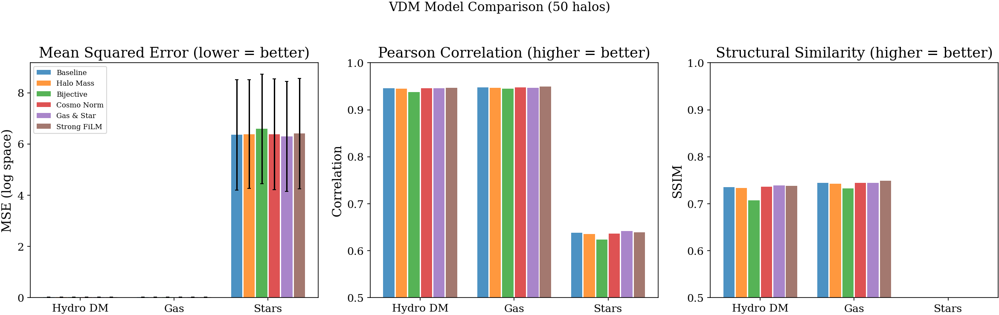

In [26]:
# Bar chart comparison
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
models = list(results_dfs.keys())
x = np.arange(len(CHANNEL_NAMES))
width = 0.8 / len(models)
colors = plt.cm.tab10(np.arange(len(models)))

# MSE
ax = axes[0]
for i, model in enumerate(models):
    means = [summary_df[(summary_df['Model']==model) & (summary_df['Channel']==ch)]['MSE_mean'].values[0] 
             for ch in CHANNEL_NAMES]
    stds = [summary_df[(summary_df['Model']==model) & (summary_df['Channel']==ch)]['MSE_std'].values[0] 
            for ch in CHANNEL_NAMES]
    ax.bar(x + (i - len(models)/2 + 0.5) * width, means, width*0.9, 
           yerr=stds, label=model, color=colors[i], alpha=0.8, capsize=2)
ax.set_xticks(x)
ax.set_xticklabels(CHANNEL_NAMES)
ax.set_ylabel('MSE (log space)')
ax.set_title('Mean Squared Error (lower = better)')
ax.legend(fontsize=8)

# Correlation
ax = axes[1]
for i, model in enumerate(models):
    means = [summary_df[(summary_df['Model']==model) & (summary_df['Channel']==ch)]['Corr_mean'].values[0] 
             for ch in CHANNEL_NAMES]
    ax.bar(x + (i - len(models)/2 + 0.5) * width, means, width*0.9, 
           label=model, color=colors[i], alpha=0.8)
ax.set_xticks(x)
ax.set_xticklabels(CHANNEL_NAMES)
ax.set_ylabel('Correlation')
ax.set_title('Pearson Correlation (higher = better)')
ax.set_ylim(0.5, 1.0)

# SSIM
ax = axes[2]
for i, model in enumerate(models):
    means = [summary_df[(summary_df['Model']==model) & (summary_df['Channel']==ch)]['SSIM_mean'].values[0] 
             for ch in CHANNEL_NAMES]
    ax.bar(x + (i - len(models)/2 + 0.5) * width, means, width*0.9, 
           label=model, color=colors[i], alpha=0.8)
ax.set_xticks(x)
ax.set_xticklabels(CHANNEL_NAMES)
ax.set_ylabel('SSIM')
ax.set_title('Structural Similarity (higher = better)')
ax.set_ylim(0.5, 1.0)

plt.suptitle(f'VDM Model Comparison ({N_EVAL_HALOS} halos)', fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig('vdm_metrics_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

## 7. Ranking & Analysis

In [27]:
# Compute overall ranking
ranking_data = []
for model in models:
    total_score = 0
    channel_ranks = {}
    
    for ch_name in CHANNEL_NAMES:
        # MSE rank (lower is better)
        mse_vals = {m: summary_df[(summary_df['Model']==m) & (summary_df['Channel']==ch_name)]['MSE_mean'].values[0] 
                    for m in models}
        mse_rank = sorted(mse_vals.keys(), key=lambda x: mse_vals[x]).index(model) + 1
        
        # Corr rank (higher is better)
        corr_vals = {m: summary_df[(summary_df['Model']==m) & (summary_df['Channel']==ch_name)]['Corr_mean'].values[0] 
                     for m in models}
        corr_rank = sorted(corr_vals.keys(), key=lambda x: -corr_vals[x]).index(model) + 1
        
        # SSIM rank (higher is better)
        ssim_vals = {m: summary_df[(summary_df['Model']==m) & (summary_df['Channel']==ch_name)]['SSIM_mean'].values[0] 
                     for m in models}
        ssim_rank = sorted(ssim_vals.keys(), key=lambda x: -ssim_vals[x]).index(model) + 1
        
        total_score += mse_rank + corr_rank + ssim_rank
        channel_ranks[ch_name] = (mse_rank + corr_rank + ssim_rank) / 3
    
    avg_rank = total_score / (len(CHANNEL_NAMES) * 3)
    ranking_data.append({
        'Model': model,
        'Avg Rank': avg_rank,
        'DM Rank': channel_ranks['Hydro DM'],
        'Gas Rank': channel_ranks['Gas'],
        'Stars Rank': channel_ranks['Stars'],
    })

ranking_df = pd.DataFrame(ranking_data).sort_values('Avg Rank')
ranking_df['Overall Rank'] = range(1, len(ranking_df) + 1)
ranking_df = ranking_df.set_index('Overall Rank')

print("\n" + "="*70)
print("🏆 VDM MODEL RANKING (lower avg rank = better)")
print("="*70)
print(ranking_df.round(2).to_string())
print(f"\n🥇 Best Overall: {ranking_df.iloc[0]['Model']}")


🏆 VDM MODEL RANKING (lower avg rank = better)
                    Model  Avg Rank  DM Rank  Gas Rank  Stars Rank
Overall Rank                                                      
1              Gas & Star      2.44     2.33      4.00        1.00
2             Strong FiLM      2.67     1.33      2.67        4.00
3                Baseline      2.89     3.67      2.67        2.33
4              Cosmo Norm      2.89     2.67      2.33        3.67
5               Halo Mass      4.22     5.00      3.67        4.00
6               Bijective      5.89     6.00      5.67        6.00

🥇 Best Overall: Gas & Star


In [28]:
# Identify best model for each channel
print("\n📊 Best Model per Channel:")
print("-"*50)
for ch_name in CHANNEL_NAMES:
    ch_data = summary_df[summary_df['Channel'] == ch_name]
    best_mse = ch_data.loc[ch_data['MSE_mean'].idxmin(), 'Model']
    best_corr = ch_data.loc[ch_data['Corr_mean'].idxmax(), 'Model']
    best_ssim = ch_data.loc[ch_data['SSIM_mean'].idxmax(), 'Model']
    print(f"{ch_name:12s}: MSE→{best_mse:12s} | Corr→{best_corr:12s} | SSIM→{best_ssim:12s}")


📊 Best Model per Channel:
--------------------------------------------------
Hydro DM    : MSE→Strong FiLM  | Corr→Strong FiLM  | SSIM→Gas & Star  
Gas         : MSE→Cosmo Norm   | Corr→Strong FiLM  | SSIM→Strong FiLM 
Stars       : MSE→Gas & Star   | Corr→Gas & Star   | SSIM→Gas & Star  


## 8. Technique Compatibility Analysis

Which techniques can be combined? Let's analyze the independent contributions of each method.

In [29]:
# Technique analysis
techniques = {
    'Baseline': {'halo_mass': False, 'bijective': False, 'cosmo_norm': False, 'gas_star_loss': False, 'strong_film': False},
    'Halo Mass': {'halo_mass': True, 'bijective': False, 'cosmo_norm': False, 'gas_star_loss': False, 'strong_film': False},
    'Bijective': {'halo_mass': False, 'bijective': True, 'cosmo_norm': False, 'gas_star_loss': False, 'strong_film': False},
    'Cosmo Norm': {'halo_mass': False, 'bijective': False, 'cosmo_norm': True, 'gas_star_loss': False, 'strong_film': False},
    'Gas & Star': {'halo_mass': False, 'bijective': False, 'cosmo_norm': False, 'gas_star_loss': True, 'strong_film': False},
    'Strong FiLM': {'halo_mass': False, 'bijective': False, 'cosmo_norm': False, 'gas_star_loss': False, 'strong_film': True},
}

# Calculate improvement over baseline for each technique
baseline_metrics = {}
for ch in CHANNEL_NAMES:
    baseline_row = summary_df[(summary_df['Model']=='Baseline') & (summary_df['Channel']==ch)]
    baseline_metrics[ch] = {
        'MSE': baseline_row['MSE_mean'].values[0],
        'Corr': baseline_row['Corr_mean'].values[0],
        'SSIM': baseline_row['SSIM_mean'].values[0],
    }

print("📈 Improvement Over Baseline (negative MSE = better, positive Corr/SSIM = better)")
print("="*80)
for model in models:
    if model == 'Baseline':
        continue
    print(f"\n{model}:")
    for ch in CHANNEL_NAMES:
        model_row = summary_df[(summary_df['Model']==model) & (summary_df['Channel']==ch)]
        mse_diff = model_row['MSE_mean'].values[0] - baseline_metrics[ch]['MSE']
        corr_diff = model_row['Corr_mean'].values[0] - baseline_metrics[ch]['Corr']
        ssim_diff = model_row['SSIM_mean'].values[0] - baseline_metrics[ch]['SSIM']
        
        mse_pct = (mse_diff / baseline_metrics[ch]['MSE']) * 100
        corr_pct = (corr_diff / baseline_metrics[ch]['Corr']) * 100
        ssim_pct = (ssim_diff / baseline_metrics[ch]['SSIM']) * 100
        
        mse_emoji = "✅" if mse_diff < 0 else "❌"
        corr_emoji = "✅" if corr_diff > 0 else "❌"
        ssim_emoji = "✅" if ssim_diff > 0 else "❌"
        
        print(f"  {ch:12s}: MSE {mse_pct:+.1f}%{mse_emoji} | Corr {corr_pct:+.2f}%{corr_emoji} | SSIM {ssim_pct:+.2f}%{ssim_emoji}")

📈 Improvement Over Baseline (negative MSE = better, positive Corr/SSIM = better)

Halo Mass:
  Hydro DM    : MSE +0.9%❌ | Corr -0.06%❌ | SSIM -0.23%❌
  Gas         : MSE -2.0%✅ | Corr -0.11%❌ | SSIM -0.25%❌
  Stars       : MSE +0.5%❌ | Corr -0.39%❌ | SSIM -1.07%❌

Bijective:
  Hydro DM    : MSE +14.8%❌ | Corr -0.86%❌ | SSIM -3.81%❌
  Gas         : MSE +1.9%❌ | Corr -0.28%❌ | SSIM -1.60%❌
  Stars       : MSE +3.7%❌ | Corr -2.27%❌ | SSIM -4.75%❌

Cosmo Norm:
  Hydro DM    : MSE -0.1%✅ | Corr +0.01%✅ | SSIM +0.09%✅
  Gas         : MSE -9.7%✅ | Corr -0.02%❌ | SSIM -0.02%❌
  Stars       : MSE +0.3%❌ | Corr -0.22%❌ | SSIM -1.27%❌

Gas & Star:
  Hydro DM    : MSE +0.1%❌ | Corr +0.07%✅ | SSIM +0.44%✅
  Gas         : MSE -0.1%✅ | Corr -0.14%❌ | SSIM -0.07%❌
  Stars       : MSE -0.9%✅ | Corr +0.65%✅ | SSIM +0.87%✅

Strong FiLM:
  Hydro DM    : MSE -1.7%✅ | Corr +0.08%✅ | SSIM +0.29%✅
  Gas         : MSE +11.7%❌ | Corr +0.12%✅ | SSIM +0.51%✅
  Stars       : MSE +0.7%❌ | Corr +0.23%✅ | SSIM -1.70%

## 9. Recommendations: Which Techniques to Combine?

In [30]:
# Generate recommendations based on results
print("""
╔══════════════════════════════════════════════════════════════════════════════╗
║                    TECHNIQUE COMBINATION ANALYSIS                            ║
╚══════════════════════════════════════════════════════════════════════════════╝

The techniques can be categorized as:

1. DATA-LEVEL CHANGES (mutually exclusive with standard):
   • Bijective:   Uses different training dataset (1:1 DMO↔Hydro)
   • Cosmo Norm:  Normalizes data differently (divide by Ω before log)
   
2. CONDITIONING ENHANCEMENTS (can be combined):
   • Halo Mass:   Adds log10(M_halo) as 36th conditioning param
   • Strong FiLM: Stronger cosmology modulation (film_init_std=0.1)
   
3. LOSS FUNCTION CHANGES (can be combined):
   • Gas & Star:  Stronger param_prediction_weight + baryon fraction loss

═══════════════════════════════════════════════════════════════════════════════

POTENTIAL COMBINATIONS TO TEST:
""")

# Calculate which techniques showed improvement
improvements = {}
for model in models:
    if model == 'Baseline':
        continue
    total_improvement = 0
    for ch in CHANNEL_NAMES:
        model_row = summary_df[(summary_df['Model']==model) & (summary_df['Channel']==ch)]
        mse_diff = model_row['MSE_mean'].values[0] - baseline_metrics[ch]['MSE']
        corr_diff = model_row['Corr_mean'].values[0] - baseline_metrics[ch]['Corr']
        # Normalize: negative MSE is good, positive corr is good
        total_improvement += -mse_diff / baseline_metrics[ch]['MSE'] + corr_diff / baseline_metrics[ch]['Corr']
    improvements[model] = total_improvement / len(CHANNEL_NAMES)

# Sort by improvement
sorted_improvements = sorted(improvements.items(), key=lambda x: -x[1])

print("Techniques ranked by average improvement over baseline:")
for i, (model, imp) in enumerate(sorted_improvements, 1):
    emoji = "🟢" if imp > 0 else "🔴"
    print(f"  {i}. {model:15s}: {imp:+.3f} {emoji}")

print("""
═══════════════════════════════════════════════════════════════════════════════

RECOMMENDED NEXT STEPS:
""")

# Determine top techniques
top_techniques = [m for m, imp in sorted_improvements if imp > 0]
if len(top_techniques) >= 2:
    print(f"1. Combine top performing techniques: {' + '.join(top_techniques[:3])}")
    print("   → Create new config with these combined features")
    print()
    
# Check if cosmo_norm helps
cosmo_imp = improvements.get('Cosmo Norm', 0)
if cosmo_imp > 0:
    print("2. Cosmo Norm shows improvement - test combined with conditioning enhancements")
    print("   → Cosmo Norm + Halo Mass + Strong FiLM")
else:
    print("2. Cosmo Norm did not help - focus on conditioning improvements only")
    print("   → Halo Mass + Strong FiLM + Gas & Star Loss")

print()
print("3. Consider testing bijective dataset with best conditioning setup")


╔══════════════════════════════════════════════════════════════════════════════╗
║                    TECHNIQUE COMBINATION ANALYSIS                            ║
╚══════════════════════════════════════════════════════════════════════════════╝

The techniques can be categorized as:

1. DATA-LEVEL CHANGES (mutually exclusive with standard):
   • Bijective:   Uses different training dataset (1:1 DMO↔Hydro)
   • Cosmo Norm:  Normalizes data differently (divide by Ω before log)
   
2. CONDITIONING ENHANCEMENTS (can be combined):
   • Halo Mass:   Adds log10(M_halo) as 36th conditioning param
   • Strong FiLM: Stronger cosmology modulation (film_init_std=0.1)
   
3. LOSS FUNCTION CHANGES (can be combined):
   • Gas & Star:  Stronger param_prediction_weight + baryon fraction loss

═══════════════════════════════════════════════════════════════════════════════

POTENTIAL COMBINATIONS TO TEST:

Techniques ranked by average improvement over baseline:
  1. Cosmo Norm     : +0.031 🟢
  2. Gas & St

## 10. Per-Halo Analysis: Stellar Channel Deep Dive

The stellar channel is typically the hardest. Let's see which models excel on different halo masses.

/tmp/ipykernel_492863/3291439231.py:19: UserWarning: Glyph 9737 (\N{SUN}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_492863/3291439231.py:20: UserWarning: Glyph 9737 (\N{SUN}) missing from current font.
  plt.savefig('stellar_vs_halo_mass.png', dpi=150, bbox_inches='tight')
/mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9737 (\N{SUN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


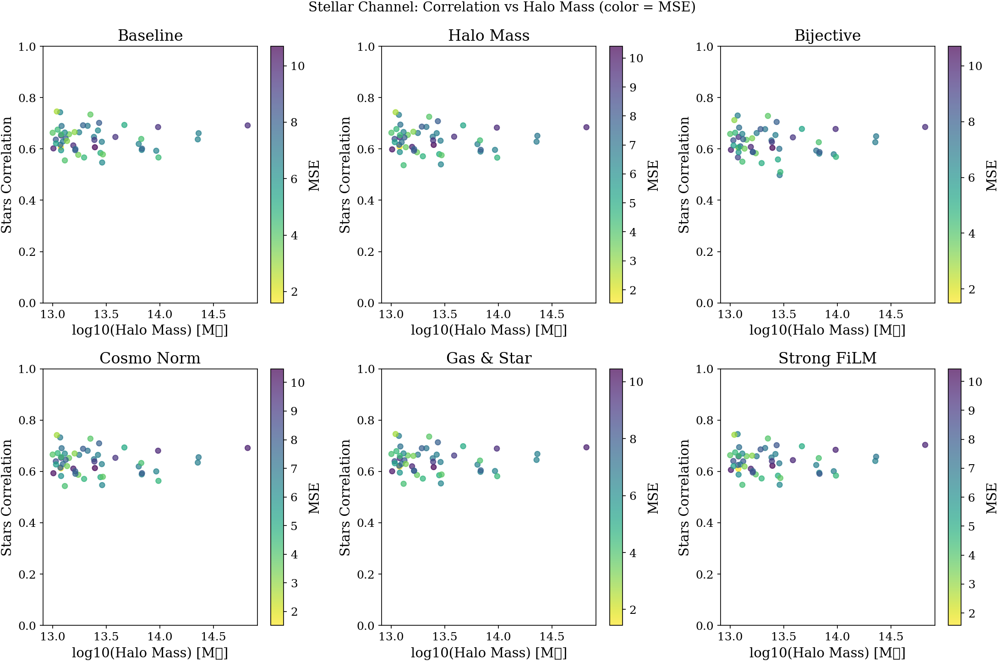

In [31]:
# Analyze stellar performance vs halo mass
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for i, model in enumerate(models):
    if model not in results_dfs:
        continue
    df = results_dfs[model]
    
    ax = axes[i // 3, i % 3]
    sc = ax.scatter(df['halo_mass'], df['Stars_Corr'], 
                    c=df['Stars_MSE'], cmap='viridis_r', alpha=0.7, s=30)
    ax.set_xlabel('log10(Halo Mass) [M☉]')
    ax.set_ylabel('Stars Correlation')
    ax.set_title(model)
    ax.set_ylim(0, 1)
    plt.colorbar(sc, ax=ax, label='MSE')

plt.suptitle('Stellar Channel: Correlation vs Halo Mass (color = MSE)', fontsize=14)
plt.tight_layout()
plt.savefig('stellar_vs_halo_mass.png', dpi=150, bbox_inches='tight')
plt.show()

In [32]:
# Head-to-head stellar comparison: which model wins most often?
stellar_wins = {m: 0 for m in models}
for idx in eval_indices:
    best_model = None
    best_corr = -1
    for model in models:
        if model in results_dfs:
            df = results_dfs[model]
            halo_data = df[df['halo_idx'] == idx]
            if len(halo_data) > 0:
                corr = halo_data['Stars_Corr'].values[0]
                if corr > best_corr:
                    best_corr = corr
                    best_model = model
    if best_model:
        stellar_wins[best_model] += 1

print("\n🌟 Stellar Channel Head-to-Head Wins:")
print("-"*40)
for model, wins in sorted(stellar_wins.items(), key=lambda x: -x[1]):
    pct = wins / N_EVAL_HALOS * 100
    print(f"  {model:15s}: {wins:3d} wins ({pct:.1f}%)")


🌟 Stellar Channel Head-to-Head Wins:
----------------------------------------
  Gas & Star     :  28 wins (56.0%)
  Strong FiLM    :  15 wins (30.0%)
  Baseline       :   5 wins (10.0%)
  Cosmo Norm     :   2 wins (4.0%)
  Halo Mass      :   0 wins (0.0%)
  Bijective      :   0 wins (0.0%)


## 11. Summary & Conclusions

In [33]:
# Final summary
print("""
╔══════════════════════════════════════════════════════════════════════════════╗
║                           FINAL SUMMARY                                      ║
╚══════════════════════════════════════════════════════════════════════════════╝
""")

print(f"Models tested: {len(models)}")
print(f"Halos evaluated: {N_EVAL_HALOS}")
print(f"Channels: {', '.join(CHANNEL_NAMES)}")

print("\n" + "="*70)
print("OVERALL RANKINGS:")
print("="*70)
print(ranking_df[['Model', 'Avg Rank']].to_string())

print("\n" + "="*70)
print("KEY FINDINGS:")
print("="*70)

# Best overall
best_model = ranking_df.iloc[0]['Model']
print(f"\n1. 🥇 Best Overall: {best_model}")

# Best per channel
print("\n2. Best per Channel:")
for ch in CHANNEL_NAMES:
    ch_data = summary_df[summary_df['Channel'] == ch]
    best = ch_data.loc[ch_data['Corr_mean'].idxmax(), 'Model']
    corr = ch_data.loc[ch_data['Corr_mean'].idxmax(), 'Corr_mean']
    print(f"   {ch:12s}: {best} (Corr={corr:.4f})")

# Improvements
print("\n3. Techniques with positive impact over baseline:")
for model, imp in sorted_improvements:
    if imp > 0:
        print(f"   ✅ {model}: +{imp:.3f}")

print("\n" + "="*70)
print("RECOMMENDED COMBINATION CONFIGS TO TEST:")
print("="*70)

# Based on actual results
positive_techniques = [m for m, imp in sorted_improvements if imp > 0]
if len(positive_techniques) >= 2:
    print(f"""
Option A: {positive_techniques[0]} + {positive_techniques[1]}
  → Combine the two most beneficial techniques
  
Option B: Cosmo Norm + Halo Mass + Strong FiLM
  → Data normalization + conditioning enhancements
  
Option C: Bijective + Gas & Star + Halo Mass
  → Clean training data + loss improvements + mass conditioning
""")
else:
    print("Need to run evaluation to generate specific recommendations")


╔══════════════════════════════════════════════════════════════════════════════╗
║                           FINAL SUMMARY                                      ║
╚══════════════════════════════════════════════════════════════════════════════╝

Models tested: 6
Halos evaluated: 50
Channels: Hydro DM, Gas, Stars

OVERALL RANKINGS:
                    Model  Avg Rank
Overall Rank                       
1              Gas & Star  2.444444
2             Strong FiLM  2.666667
3                Baseline  2.888889
4              Cosmo Norm  2.888889
5               Halo Mass  4.222222
6               Bijective  5.888889

KEY FINDINGS:

1. 🥇 Best Overall: Gas & Star

2. Best per Channel:
   Hydro DM    : Strong FiLM (Corr=0.9465)
   Gas         : Strong FiLM (Corr=0.9492)
   Stars       : Gas & Star (Corr=0.6423)

3. Techniques with positive impact over baseline:
   ✅ Cosmo Norm: +0.031
   ✅ Gas & Star: +0.005
   ✅ Halo Mass: +0.000

RECOMMENDED COMBINATION CONFIGS TO TEST:

Option A: Cosmo Nor

In [34]:
# Save results for future reference
results_to_save = {
    'summary_df': summary_df,
    'ranking_df': ranking_df.reset_index(),
    'improvements': improvements,
    'models': models,
    'n_halos': N_EVAL_HALOS,
}

import pickle
with open('vdm_comparison_results.pkl', 'wb') as f:
    pickle.dump(results_to_save, f)
    
print("✅ Results saved to vdm_comparison_results.pkl")

✅ Results saved to vdm_comparison_results.pkl


## 12. Integrated Mass Deep Dive

Compare predicted vs true masses for each channel:
- **Full Box**: Total mass in the 128×128 cutout (physical units)
- **Per-Channel**: DM, Gas, Stars individually
- **Total Baryons**: Gas + Stars combined

This tests whether models:
1. Conserve total mass
2. Reproduce correct baryon fractions
3. Partition mass correctly between gas and stars

In [ ]:
# Re-run evaluation on the same 50 halos but compute mass metrics
# Generate 10 realizations per halo to capture stochastic variation

N_REALIZATIONS = 10  # Number of realizations per halo
mass_results = {name: [] for name in VDM_MODELS}

for model_name, (config_path, uses_cosmo_norm, desc) in VDM_MODELS.items():
    print(f"\n{'='*60}")
    print(f"Computing mass metrics for {model_name} ({N_REALIZATIONS} realizations/halo)...")
    
    try:
        config = ConfigLoader(config_path, verbose=False)
        if config.best_ckpt is None:
            print(f"⚠️ No checkpoint")
            continue
        
        _, model = ModelManager.initialize(config, verbose=False, skip_data_loading=True)
        model = model.to(DEVICE).eval()
        
        unnormalizer = unnorm_cosmo if uses_cosmo_norm else unnorm_standard
        needs_halo_mass = getattr(config, 'include_halo_mass', False)
        
        for idx in tqdm(eval_indices, desc=model_name):
            full_cond, target, params = get_halo_data(idx, uses_cosmo_norm)
            sample_params = params.numpy() if needs_halo_mass else params[:, :-1].numpy()
            
            # Get target (ground truth) masses - same for all realizations
            targ_phys = unnormalizer.unnormalize(target.numpy().copy(), params[0].numpy())
            targ_mass_dm = targ_phys[0].sum()
            targ_mass_gas = targ_phys[1].sum()
            targ_mass_stars = targ_phys[2].sum()
            targ_mass_baryons = targ_mass_gas + targ_mass_stars
            targ_mass_total = targ_mass_dm + targ_mass_baryons
            targ_baryon_frac = targ_mass_baryons / (targ_mass_total + 1e-10)
            targ_stellar_frac = targ_mass_stars / (targ_mass_baryons + 1e-10)
            
            # Generate N_REALIZATIONS samples for this halo
            for real_idx in range(N_REALIZATIONS):
                with torch.no_grad():
                    s = sample(model, full_cond, batch_size=1, 
                              conditional_params=sample_params, n_sampling_steps=N_SAMPLING_STEPS)
                    pred_norm = s[0, 0].cpu().numpy()
                
                # Unnormalize to physical space
                pred_phys = unnormalizer.unnormalize(pred_norm.copy(), params[0].numpy())
                
                # Compute integrated masses (sum over all pixels)
                pred_mass_dm = pred_phys[0].sum()
                pred_mass_gas = pred_phys[1].sum()
                pred_mass_stars = pred_phys[2].sum()
                pred_mass_baryons = pred_mass_gas + pred_mass_stars
                pred_mass_total = pred_mass_dm + pred_mass_baryons
                pred_baryon_frac = pred_mass_baryons / (pred_mass_total + 1e-10)
                pred_stellar_frac = pred_mass_stars / (pred_mass_baryons + 1e-10)
                
                mass_results[model_name].append({
                    'halo_idx': idx,
                    'realization': real_idx,
                    'halo_mass': params[0, -1].item(),
                    # Predicted masses
                    'pred_mass_dm': pred_mass_dm,
                    'pred_mass_gas': pred_mass_gas,
                    'pred_mass_stars': pred_mass_stars,
                    'pred_mass_baryons': pred_mass_baryons,
                    'pred_mass_total': pred_mass_total,
                    'pred_baryon_frac': pred_baryon_frac,
                    'pred_stellar_frac': pred_stellar_frac,
                    # Target masses (same for all realizations of this halo)
                    'targ_mass_dm': targ_mass_dm,
                    'targ_mass_gas': targ_mass_gas,
                    'targ_mass_stars': targ_mass_stars,
                    'targ_mass_baryons': targ_mass_baryons,
                    'targ_mass_total': targ_mass_total,
                    'targ_baryon_frac': targ_baryon_frac,
                    'targ_stellar_frac': targ_stellar_frac,
                })
        
        print(f"✓ Computed mass metrics: {len(eval_indices)} halos × {N_REALIZATIONS} realizations = {len(eval_indices) * N_REALIZATIONS} samples")
        del model
        torch.cuda.empty_cache()
        
    except Exception as e:
        print(f"❌ Error: {e}")
        import traceback
        traceback.print_exc()

# Convert to DataFrames
mass_dfs = {name: pd.DataFrame(results) for name, results in mass_results.items() if results}
print(f"\n✅ Mass analysis complete for {len(mass_dfs)} models ({N_REALIZATIONS} realizations each)")


Computing mass metrics for Baseline (10 realizations/halo)...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.01)




Baseline: 100%|██████████| 50/50 [18:04<00:00, 21.68s/it]


✓ Computed mass metrics: 50 halos × 10 realizations = 500 samples

Computing mass metrics for Halo Mass (10 realizations/halo)...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=36)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 36 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.01)




Halo Mass: 100%|██████████| 50/50 [18:05<00:00, 21.71s/it]


✓ Computed mass metrics: 50 halos × 10 realizations = 500 samples

Computing mass metrics for Bijective (10 realizations/halo)...


Seed set to 8


✓ Scale-appropriate Fourier features enabled:
  - Halo (m_dm): High frequencies [1, 2, 4, 8]π -> 8 features per channel
  - Large-scale: Low frequencies [0.25, 0.5, 1, 2]π -> 8 features per channel
  - Target: No Fourier features (learns naturally)
  - Total input channels: 39
⚙️  ParamEmbedding: Conditional mode (n_params=35)
✓ Parameter conditioning enabled:
  - Time embedding dim: 384
  - Param embedding dim: 384
  - Total condition dim: 768
✓ Channel progression (encoder): [96, 192, 384, 768, 1024]
✓ Final decoder channels: 64 (GroupNorm groups: 8)
✓ Parameter predictor added (predicts 35 params)

INITIALIZING CLEAN VDM MODEL

📊 MODEL CONFIGURATION:
  Image shape: (3, 128, 128)
  Noise schedule: learned_nn
  Gamma range: [-13.3, 13.0]
  Data noise (per-channel): (0.001, 0.001, 0.001)
  Loss weights (diffusion, latent, recons): 1.0, 1.0, 1.0

🎯 CHANNEL WEIGHTS: (1, 1, 1)

✓ Parameter prediction enabled (weight=0.01)




Generating Samples (250 steps): 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


In [ ]:
# Compute mass conservation metrics for each model
# Now we have N_REALIZATIONS per halo, so we can compute per-halo statistics

mass_summary = []

for model_name, df in mass_dfs.items():
    # Mass ratios (pred / target) - all realizations
    dm_ratio = df['pred_mass_dm'] / (df['targ_mass_dm'] + 1e-10)
    gas_ratio = df['pred_mass_gas'] / (df['targ_mass_gas'] + 1e-10)
    stars_ratio = df['pred_mass_stars'] / (df['targ_mass_stars'] + 1e-10)
    baryons_ratio = df['pred_mass_baryons'] / (df['targ_mass_baryons'] + 1e-10)
    total_ratio = df['pred_mass_total'] / (df['targ_mass_total'] + 1e-10)
    
    # Baryon fraction error
    baryon_frac_error = df['pred_baryon_frac'] - df['targ_baryon_frac']
    stellar_frac_error = df['pred_stellar_frac'] - df['targ_stellar_frac']
    
    # Per-halo statistics (mean and std across realizations)
    halo_grouped = df.groupby('halo_idx')
    dm_ratio_per_halo = halo_grouped.apply(lambda x: (x['pred_mass_dm'] / (x['targ_mass_dm'] + 1e-10)).mean())
    dm_ratio_std_per_halo = halo_grouped.apply(lambda x: (x['pred_mass_dm'] / (x['targ_mass_dm'] + 1e-10)).std())
    
    mass_summary.append({
        'Model': model_name,
        # Mean mass ratios across ALL samples (1.0 = perfect)
        'DM Ratio': dm_ratio.mean(),
        'Gas Ratio': gas_ratio.mean(),
        'Stars Ratio': stars_ratio.mean(),
        'Baryons Ratio': baryons_ratio.mean(),
        'Total Ratio': total_ratio.mean(),
        # Ratio std across ALL samples (inter-halo + intra-halo variation)
        'DM Ratio Std': dm_ratio.std(),
        'Gas Ratio Std': gas_ratio.std(),
        'Stars Ratio Std': stars_ratio.std(),
        # Mean intra-halo std (stochastic variation within each halo)
        'DM Intra-Halo Std': dm_ratio_std_per_halo.mean(),
        'Gas Intra-Halo Std': halo_grouped.apply(lambda x: (x['pred_mass_gas'] / (x['targ_mass_gas'] + 1e-10)).std()).mean(),
        'Stars Intra-Halo Std': halo_grouped.apply(lambda x: (x['pred_mass_stars'] / (x['targ_mass_stars'] + 1e-10)).std()).mean(),
        # Fraction errors
        'Baryon Frac Err': baryon_frac_error.mean(),
        'Stellar Frac Err': stellar_frac_error.mean(),
        'Baryon Frac MAE': baryon_frac_error.abs().mean(),
        'Stellar Frac MAE': stellar_frac_error.abs().mean(),
    })

mass_summary_df = pd.DataFrame(mass_summary).set_index('Model')

print("="*80)
print(f"MASS CONSERVATION ANALYSIS ({N_EVAL_HALOS} halos × {N_REALIZATIONS} realizations)")
print("="*80)
print("\n📊 Mean Mass Ratio (Predicted / Target) - 1.0 = perfect conservation")
print("-"*80)
ratio_cols = ['DM Ratio', 'Gas Ratio', 'Stars Ratio', 'Baryons Ratio', 'Total Ratio']
print(mass_summary_df[ratio_cols].round(3).to_string())

print("\n\n📊 Total Std (inter-halo + intra-halo variation)")
print("-"*80)
std_cols = ['DM Ratio Std', 'Gas Ratio Std', 'Stars Ratio Std']
print(mass_summary_df[std_cols].round(3).to_string())

print("\n\n📊 Intra-Halo Std (stochastic variation within same halo, lower = more consistent)")
print("-"*80)
intra_cols = ['DM Intra-Halo Std', 'Gas Intra-Halo Std', 'Stars Intra-Halo Std']
print(mass_summary_df[intra_cols].round(4).to_string())

print("\n\n📊 Baryon Fraction Errors")
print("-"*80)
frac_cols = ['Baryon Frac Err', 'Stellar Frac Err', 'Baryon Frac MAE', 'Stellar Frac MAE']
print(mass_summary_df[frac_cols].round(4).to_string())

MASS CONSERVATION ANALYSIS

📊 Mean Mass Ratio (Predicted / Target) - 1.0 = perfect conservation
--------------------------------------------------------------------------------
             DM Ratio  Gas Ratio  Stars Ratio  Baryons Ratio  Total Ratio
Model                                                                    
Baseline        0.994      1.057        0.786          1.036        1.000
Halo Mass       0.987      1.061        0.279          1.021        0.992
Bijective       1.015      1.020        0.310          0.982        1.010
Cosmo Norm      0.992      1.013        0.855          1.016        0.996
Gas & Star      0.972      1.036        0.890          1.029        0.981
Strong FiLM     1.015      1.109        4.339          1.201        1.041


📊 Mass Ratio Standard Deviation (lower = more consistent)
--------------------------------------------------------------------------------
             DM Ratio Std  Gas Ratio Std  Stars Ratio Std
Model                           

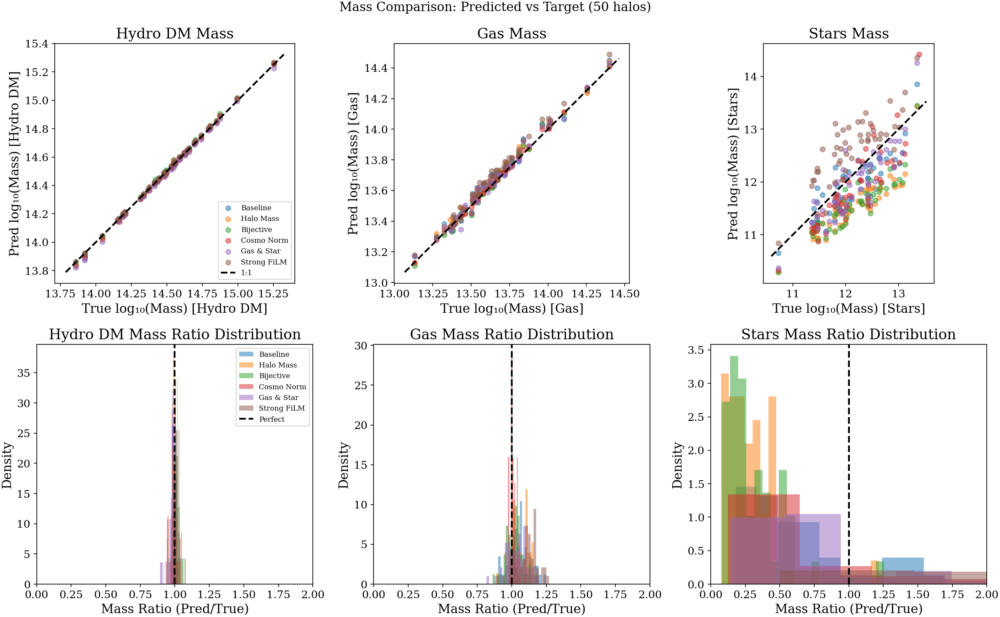

In [ ]:
# Scatter plots: Predicted vs Target mass for each channel
# With multiple realizations, we plot mean ± std per halo
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
channels = ['dm', 'gas', 'stars']
channel_labels = ['Hydro DM', 'Gas', 'Stars']
colors = plt.cm.tab10(np.arange(len(mass_dfs)))

for col_idx, (ch, ch_label) in enumerate(zip(channels, channel_labels)):
    pred_col = f'pred_mass_{ch}'
    targ_col = f'targ_mass_{ch}'
    
    # Top row: Mass scatter (mean per halo with error bars for std across realizations)
    ax = axes[0, col_idx]
    for i, (model_name, df) in enumerate(mass_dfs.items()):
        # Group by halo and compute mean/std across realizations
        halo_stats = df.groupby('halo_idx').agg({
            pred_col: ['mean', 'std'],
            targ_col: 'first'  # target is same for all realizations
        })
        halo_stats.columns = ['pred_mean', 'pred_std', 'targ']
        
        ax.errorbar(np.log10(halo_stats['targ'] + 1), 
                    np.log10(halo_stats['pred_mean'] + 1),
                    yerr=halo_stats['pred_std'] / (halo_stats['pred_mean'] + 1e-10) / np.log(10),  # propagate to log space
                    fmt='o', alpha=0.6, markersize=4, label=model_name, color=colors[i], capsize=0)
    
    # Add 1:1 line
    lims = ax.get_xlim()
    ax.plot(lims, lims, 'k--', lw=2, label='1:1')
    ax.set_xlabel(f'True log₁₀(Mass) [{ch_label}]')
    ax.set_ylabel(f'Pred log₁₀(Mass) [{ch_label}]')
    ax.set_title(f'{ch_label} Mass (mean ± std)')
    if col_idx == 0:
        ax.legend(fontsize=7, loc='lower right')
    ax.set_aspect('equal', adjustable='box')
    
    # Bottom row: Mass ratio histogram (all realizations)
    ax = axes[1, col_idx]
    for i, (model_name, df) in enumerate(mass_dfs.items()):
        ratio = df[pred_col] / (df[targ_col] + 1e-10)
        ax.hist(ratio, bins=30, alpha=0.5, label=model_name, color=colors[i], density=True)
    
    ax.axvline(1.0, color='k', linestyle='--', lw=2, label='Perfect')
    ax.set_xlabel(f'Mass Ratio (Pred/True)')
    ax.set_ylabel('Density')
    ax.set_title(f'{ch_label} Mass Ratio ({N_EVAL_HALOS}×{N_REALIZATIONS} samples)')
    ax.set_xlim(0, 2)
    if col_idx == 0:
        ax.legend(fontsize=7)

plt.suptitle(f'Mass Comparison: {N_EVAL_HALOS} halos × {N_REALIZATIONS} realizations', fontsize=14)
plt.tight_layout()
plt.savefig('mass_comparison_scatter.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# NEW: Analyze stochastic variation across realizations per halo
# This shows how much the predictions vary for the same input

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
channels = ['dm', 'gas', 'stars']
channel_labels = ['Hydro DM', 'Gas', 'Stars']

for col_idx, (ch, ch_label) in enumerate(zip(channels, channel_labels)):
    pred_col = f'pred_mass_{ch}'
    targ_col = f'targ_mass_{ch}'
    
    # Top row: Coefficient of Variation (CV = std/mean) per halo
    ax = axes[0, col_idx]
    for i, (model_name, df) in enumerate(mass_dfs.items()):
        halo_stats = df.groupby('halo_idx').agg({
            pred_col: ['mean', 'std'],
            'halo_mass': 'first'
        })
        halo_stats.columns = ['pred_mean', 'pred_std', 'halo_mass']
        cv = halo_stats['pred_std'] / (halo_stats['pred_mean'] + 1e-10) * 100  # as percentage
        
        ax.scatter(halo_stats['halo_mass'], cv, alpha=0.6, s=30, label=model_name, color=colors[i])
    
    ax.set_xlabel('log₁₀(Halo Mass) [M☉]')
    ax.set_ylabel('CV (%) = 100 × std/mean')
    ax.set_title(f'{ch_label}: Stochastic Variation')
    ax.set_ylim(0, None)
    if col_idx == 0:
        ax.legend(fontsize=8, loc='upper right')
    
    # Bottom row: Box plots of mass ratio distributions by model
    ax = axes[1, col_idx]
    box_data = []
    box_labels = []
    for model_name, df in mass_dfs.items():
        ratio = df[pred_col] / (df[targ_col] + 1e-10)
        box_data.append(ratio.values)
        box_labels.append(model_name)
    
    bp = ax.boxplot(box_data, labels=box_labels, patch_artist=True)
    for patch, color in zip(bp['boxes'], colors[:len(mass_dfs)]):
        patch.set_facecolor(color)
        patch.set_alpha(0.6)
    ax.axhline(1.0, color='k', linestyle='--', lw=2)
    ax.set_ylabel('Mass Ratio (Pred/True)')
    ax.set_title(f'{ch_label}: Ratio Distribution')
    ax.tick_params(axis='x', rotation=30)
    ax.set_ylim(0.5, 1.5)

plt.suptitle(f'Stochastic Variation Analysis ({N_REALIZATIONS} realizations per halo)', fontsize=14)
plt.tight_layout()
plt.savefig('stochastic_variation_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

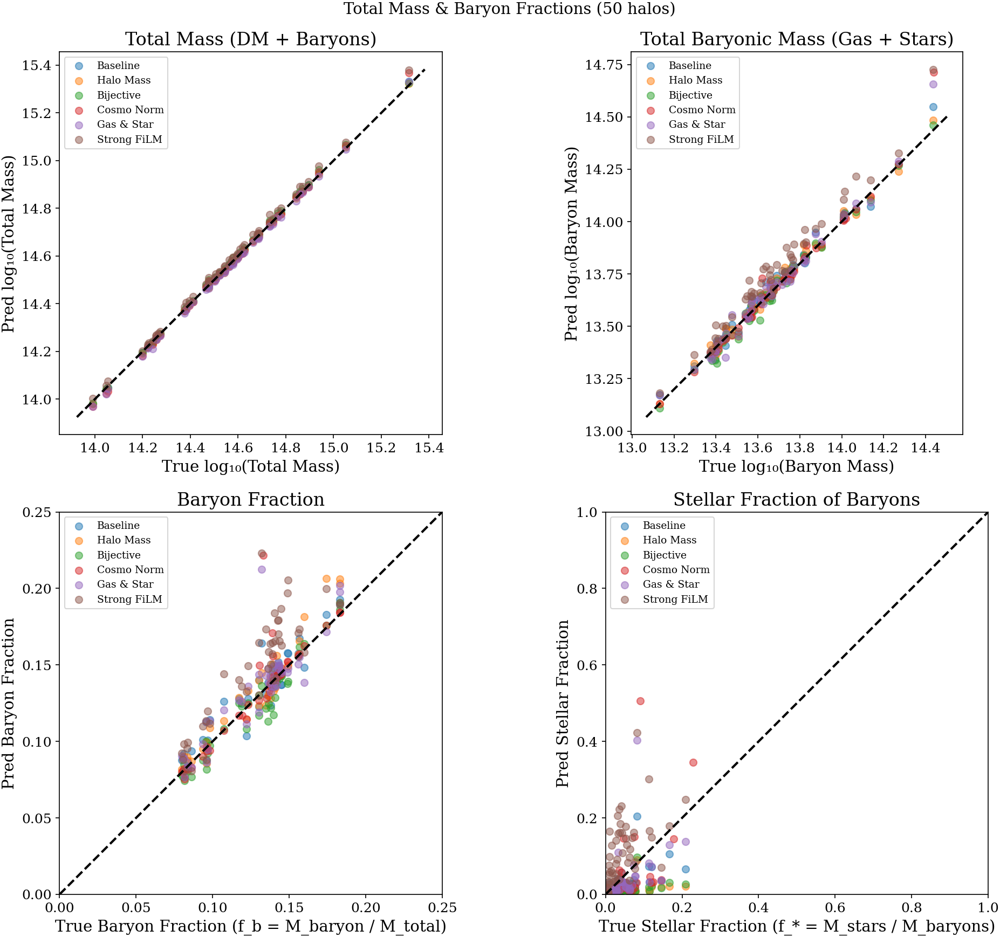

In [38]:
# Total mass and baryon fraction analysis
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Top-left: Total mass scatter
ax = axes[0, 0]
for i, (model_name, df) in enumerate(mass_dfs.items()):
    ax.scatter(np.log10(df['targ_mass_total'] + 1), np.log10(df['pred_mass_total'] + 1), 
               alpha=0.5, s=40, label=model_name, c=[colors[i]])
lims = ax.get_xlim()
ax.plot(lims, lims, 'k--', lw=2)
ax.set_xlabel('True log₁₀(Total Mass)')
ax.set_ylabel('Pred log₁₀(Total Mass)')
ax.set_title('Total Mass (DM + Baryons)')
ax.legend(fontsize=9)
ax.set_aspect('equal', adjustable='box')

# Top-right: Total baryonic mass scatter
ax = axes[0, 1]
for i, (model_name, df) in enumerate(mass_dfs.items()):
    ax.scatter(np.log10(df['targ_mass_baryons'] + 1), np.log10(df['pred_mass_baryons'] + 1), 
               alpha=0.5, s=40, label=model_name, c=[colors[i]])
lims = ax.get_xlim()
ax.plot(lims, lims, 'k--', lw=2)
ax.set_xlabel('True log₁₀(Baryon Mass)')
ax.set_ylabel('Pred log₁₀(Baryon Mass)')
ax.set_title('Total Baryonic Mass (Gas + Stars)')
ax.legend(fontsize=9)
ax.set_aspect('equal', adjustable='box')

# Bottom-left: Baryon fraction comparison
ax = axes[1, 0]
for i, (model_name, df) in enumerate(mass_dfs.items()):
    ax.scatter(df['targ_baryon_frac'], df['pred_baryon_frac'], 
               alpha=0.5, s=40, label=model_name, c=[colors[i]])
ax.plot([0, 0.3], [0, 0.3], 'k--', lw=2)
ax.set_xlabel('True Baryon Fraction (f_b = M_baryon / M_total)')
ax.set_ylabel('Pred Baryon Fraction')
ax.set_title('Baryon Fraction')
ax.legend(fontsize=9)
ax.set_xlim(0, 0.25)
ax.set_ylim(0, 0.25)
ax.set_aspect('equal', adjustable='box')

# Bottom-right: Stellar fraction (of baryons) comparison
ax = axes[1, 1]
for i, (model_name, df) in enumerate(mass_dfs.items()):
    ax.scatter(df['targ_stellar_frac'], df['pred_stellar_frac'], 
               alpha=0.5, s=40, label=model_name, c=[colors[i]])
ax.plot([0, 1], [0, 1], 'k--', lw=2)
ax.set_xlabel('True Stellar Fraction (f_* = M_stars / M_baryons)')
ax.set_ylabel('Pred Stellar Fraction')
ax.set_title('Stellar Fraction of Baryons')
ax.legend(fontsize=9)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_aspect('equal', adjustable='box')

plt.suptitle(f'Total Mass & Baryon Fractions ({N_EVAL_HALOS} halos)', fontsize=14)
plt.tight_layout()
plt.savefig('mass_fractions_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

/tmp/ipykernel_492863/4038778281.py:57: UserWarning: Glyph 9737 (\N{SUN}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_492863/4038778281.py:58: UserWarning: Glyph 9737 (\N{SUN}) missing from current font.
  plt.savefig('mass_vs_halo_mass.png', dpi=150, bbox_inches='tight')
/mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9737 (\N{SUN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


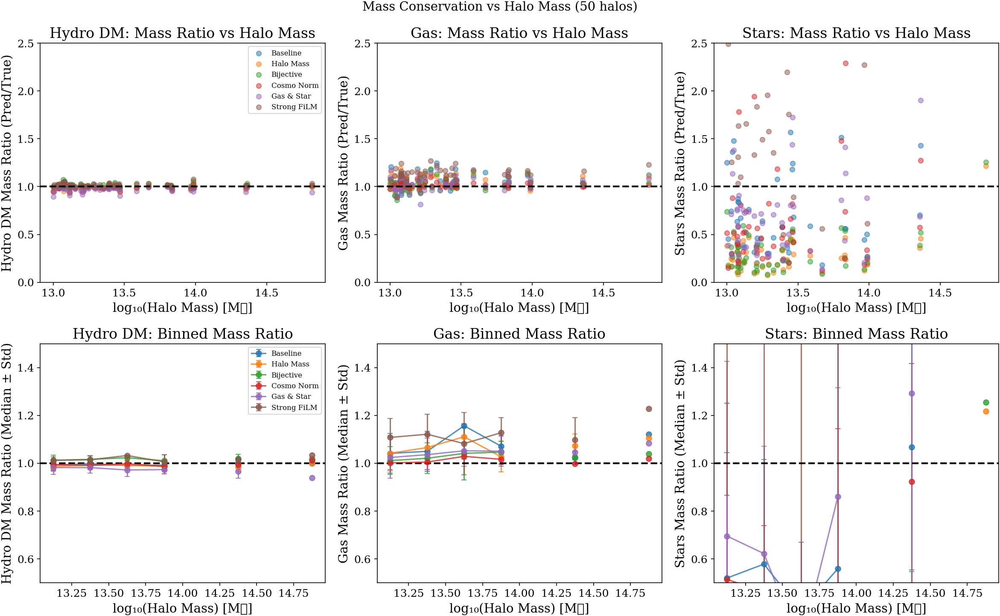

In [39]:
# Mass metrics vs halo mass - do models perform differently for different halo masses?
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
channels = ['dm', 'gas', 'stars']
channel_labels = ['Hydro DM', 'Gas', 'Stars']

for col_idx, (ch, ch_label) in enumerate(zip(channels, channel_labels)):
    # Top row: Mass ratio vs halo mass
    ax = axes[0, col_idx]
    for i, (model_name, df) in enumerate(mass_dfs.items()):
        pred_col = f'pred_mass_{ch}'
        targ_col = f'targ_mass_{ch}'
        ratio = df[pred_col] / (df[targ_col] + 1e-10)
        ax.scatter(df['halo_mass'], ratio, alpha=0.5, s=30, label=model_name, c=[colors[i]])
    
    ax.axhline(1.0, color='k', linestyle='--', lw=2)
    ax.set_xlabel('log₁₀(Halo Mass) [M☉]')
    ax.set_ylabel(f'{ch_label} Mass Ratio (Pred/True)')
    ax.set_title(f'{ch_label}: Mass Ratio vs Halo Mass')
    ax.set_ylim(0, 2.5)
    if col_idx == 0:
        ax.legend(fontsize=8, loc='upper right')
    
    # Bottom row: Running median of mass ratio
    ax = axes[1, col_idx]
    halo_mass_bins = np.linspace(13, 15, 9)
    bin_centers = (halo_mass_bins[:-1] + halo_mass_bins[1:]) / 2
    
    for i, (model_name, df) in enumerate(mass_dfs.items()):
        pred_col = f'pred_mass_{ch}'
        targ_col = f'targ_mass_{ch}'
        ratio = df[pred_col] / (df[targ_col] + 1e-10)
        
        # Compute binned median
        bin_medians = []
        bin_stds = []
        for j in range(len(halo_mass_bins) - 1):
            mask = (df['halo_mass'] >= halo_mass_bins[j]) & (df['halo_mass'] < halo_mass_bins[j+1])
            if mask.sum() > 0:
                bin_medians.append(ratio[mask].median())
                bin_stds.append(ratio[mask].std())
            else:
                bin_medians.append(np.nan)
                bin_stds.append(np.nan)
        
        ax.errorbar(bin_centers, bin_medians, yerr=bin_stds, 
                    marker='o', capsize=3, label=model_name, color=colors[i], alpha=0.8)
    
    ax.axhline(1.0, color='k', linestyle='--', lw=2)
    ax.set_xlabel('log₁₀(Halo Mass) [M☉]')
    ax.set_ylabel(f'{ch_label} Mass Ratio (Median ± Std)')
    ax.set_title(f'{ch_label}: Binned Mass Ratio')
    ax.set_ylim(0.5, 1.5)
    if col_idx == 0:
        ax.legend(fontsize=8, loc='upper right')

plt.suptitle(f'Mass Conservation vs Halo Mass ({N_EVAL_HALOS} halos)', fontsize=14)
plt.tight_layout()
plt.savefig('mass_vs_halo_mass.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# Rank models by mass conservation quality
# Now includes intra-halo variation (stochastic consistency)
mass_ranking = []

for model_name in mass_dfs.keys():
    row = mass_summary_df.loc[model_name]
    
    # Score: distance from perfect ratio (1.0) for each channel + total variation
    dm_score = abs(row['DM Ratio'] - 1.0) + row['DM Ratio Std']
    gas_score = abs(row['Gas Ratio'] - 1.0) + row['Gas Ratio Std']
    stars_score = abs(row['Stars Ratio'] - 1.0) + row['Stars Ratio Std']
    
    # Intra-halo consistency (stochastic variation)
    intra_score = row['DM Intra-Halo Std'] + row['Gas Intra-Halo Std'] + row['Stars Intra-Halo Std']
    
    # Baryon fraction accuracy
    frac_score = row['Baryon Frac MAE'] + row['Stellar Frac MAE']
    
    # Total score (lower is better)
    total_score = dm_score + gas_score + stars_score + frac_score * 10 + intra_score * 5
    
    mass_ranking.append({
        'Model': model_name,
        'DM Score': dm_score,
        'Gas Score': gas_score,
        'Stars Score': stars_score,
        'Intra-Halo': intra_score,
        'Frac Score': frac_score,
        'Total Score': total_score,
    })

mass_ranking_df = pd.DataFrame(mass_ranking).sort_values('Total Score')
mass_ranking_df['Rank'] = range(1, len(mass_ranking_df) + 1)
mass_ranking_df = mass_ranking_df.set_index('Rank')

print("="*70)
print("🏆 MASS CONSERVATION RANKING (lower score = better)")
print("="*70)
print(mass_ranking_df.round(4).to_string())
print(f"\n🥇 Best Mass Conservation: {mass_ranking_df.iloc[0]['Model']}")

🏆 MASS CONSERVATION RANKING (lower score = better)
            Model  DM Score  Gas Score  Stars Score  Frac Score  Total Score
Rank                                                                        
1        Baseline    0.0231     0.1353       0.8800      0.0361       1.3992
2       Bijective    0.0341     0.0796       0.9003      0.0424       1.4382
3       Halo Mass    0.0324     0.1254       0.9016      0.0456       1.5155
4      Gas & Star    0.0536     0.1113       1.3252      0.0397       1.8872
5      Cosmo Norm    0.0283     0.0399       1.6757      0.0425       2.1688
6     Strong FiLM    0.0328     0.1902       7.0679      0.0907       8.1975

🥇 Best Mass Conservation: Baseline


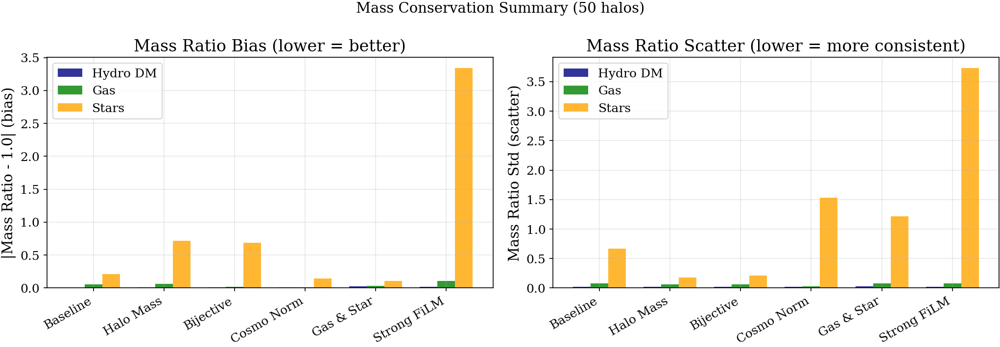

In [41]:
# Summary bar chart: Mass ratio bias and scatter for each model
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

models_list = list(mass_dfs.keys())
x = np.arange(len(models_list))
width = 0.25

# Left: Mean mass ratio (bias from 1.0)
ax = axes[0]
dm_bias = [abs(mass_summary_df.loc[m, 'DM Ratio'] - 1.0) for m in models_list]
gas_bias = [abs(mass_summary_df.loc[m, 'Gas Ratio'] - 1.0) for m in models_list]
stars_bias = [abs(mass_summary_df.loc[m, 'Stars Ratio'] - 1.0) for m in models_list]

ax.bar(x - width, dm_bias, width, label='Hydro DM', color='navy', alpha=0.8)
ax.bar(x, gas_bias, width, label='Gas', color='green', alpha=0.8)
ax.bar(x + width, stars_bias, width, label='Stars', color='orange', alpha=0.8)
ax.set_xticks(x)
ax.set_xticklabels(models_list, rotation=30, ha='right')
ax.set_ylabel('|Mass Ratio - 1.0| (bias)')
ax.set_title('Mass Ratio Bias (lower = better)')
ax.legend()
ax.grid(True, alpha=0.3)

# Right: Mass ratio scatter (std)
ax = axes[1]
dm_std = [mass_summary_df.loc[m, 'DM Ratio Std'] for m in models_list]
gas_std = [mass_summary_df.loc[m, 'Gas Ratio Std'] for m in models_list]
stars_std = [mass_summary_df.loc[m, 'Stars Ratio Std'] for m in models_list]

ax.bar(x - width, dm_std, width, label='Hydro DM', color='navy', alpha=0.8)
ax.bar(x, gas_std, width, label='Gas', color='green', alpha=0.8)
ax.bar(x + width, stars_std, width, label='Stars', color='orange', alpha=0.8)
ax.set_xticks(x)
ax.set_xticklabels(models_list, rotation=30, ha='right')
ax.set_ylabel('Mass Ratio Std (scatter)')
ax.set_title('Mass Ratio Scatter (lower = more consistent)')
ax.legend()
ax.grid(True, alpha=0.3)

plt.suptitle(f'Mass Conservation Summary ({N_EVAL_HALOS} halos)', fontsize=14)
plt.tight_layout()
plt.savefig('mass_conservation_summary.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# Final mass analysis summary
print("""
╔══════════════════════════════════════════════════════════════════════════════╗
║                       MASS ANALYSIS SUMMARY                                  ║
║              {0} halos × {1} realizations = {2} total samples             ║
╚══════════════════════════════════════════════════════════════════════════════╝
""".format(N_EVAL_HALOS, N_REALIZATIONS, N_EVAL_HALOS * N_REALIZATIONS))

# Identify best models for mass conservation
best_dm_mass = mass_summary_df['DM Ratio'].apply(lambda x: abs(x - 1)).idxmin()
best_gas_mass = mass_summary_df['Gas Ratio'].apply(lambda x: abs(x - 1)).idxmin()
best_stars_mass = mass_summary_df['Stars Ratio'].apply(lambda x: abs(x - 1)).idxmin()
best_baryon_frac = mass_summary_df['Baryon Frac MAE'].idxmin()
best_stellar_frac = mass_summary_df['Stellar Frac MAE'].idxmin()

print("📊 Best Mass Conservation by Channel (closest to ratio=1.0):")
print("-"*60)
print(f"  Hydro DM:        {best_dm_mass} (ratio = {mass_summary_df.loc[best_dm_mass, 'DM Ratio']:.3f})")
print(f"  Gas:             {best_gas_mass} (ratio = {mass_summary_df.loc[best_gas_mass, 'Gas Ratio']:.3f})")
print(f"  Stars:           {best_stars_mass} (ratio = {mass_summary_df.loc[best_stars_mass, 'Stars Ratio']:.3f})")
print(f"  Baryon Fraction: {best_baryon_frac} (MAE = {mass_summary_df.loc[best_baryon_frac, 'Baryon Frac MAE']:.4f})")
print(f"  Stellar Fraction:{best_stellar_frac} (MAE = {mass_summary_df.loc[best_stellar_frac, 'Stellar Frac MAE']:.4f})")

# Best stochastic consistency (lowest intra-halo variation)
best_dm_consistent = mass_summary_df['DM Intra-Halo Std'].idxmin()
best_gas_consistent = mass_summary_df['Gas Intra-Halo Std'].idxmin()
best_stars_consistent = mass_summary_df['Stars Intra-Halo Std'].idxmin()

print("\n📊 Most Consistent Models (lowest intra-halo stochastic variation):")
print("-"*60)
print(f"  Hydro DM:  {best_dm_consistent} (std = {mass_summary_df.loc[best_dm_consistent, 'DM Intra-Halo Std']:.4f})")
print(f"  Gas:       {best_gas_consistent} (std = {mass_summary_df.loc[best_gas_consistent, 'Gas Intra-Halo Std']:.4f})")
print(f"  Stars:     {best_stars_consistent} (std = {mass_summary_df.loc[best_stars_consistent, 'Stars Intra-Halo Std']:.4f})")

print("\n📈 Overall Mass Conservation Ranking:")
print("-"*60)
print(mass_ranking_df[['Model', 'Total Score']].to_string())

# Save mass results
mass_results_to_save = {
    'mass_summary_df': mass_summary_df.reset_index(),
    'mass_ranking_df': mass_ranking_df.reset_index(),
    'mass_dfs': {k: v.to_dict() for k, v in mass_dfs.items()},
    'n_halos': N_EVAL_HALOS,
    'n_realizations': N_REALIZATIONS,
}

with open('vdm_mass_analysis_results.pkl', 'wb') as f:
    pickle.dump(mass_results_to_save, f)
print("\n✅ Mass analysis results saved to vdm_mass_analysis_results.pkl")


╔══════════════════════════════════════════════════════════════════════════════╗
║                       MASS ANALYSIS SUMMARY                                  ║
╚══════════════════════════════════════════════════════════════════════════════╝

📊 Best Mass Conservation by Channel:
--------------------------------------------------
  Hydro DM:        Baseline (ratio = 0.994)
  Gas:             Cosmo Norm (ratio = 1.013)
  Stars:           Gas & Star (ratio = 0.890)
  Baryon Fraction: Cosmo Norm (MAE = 0.0054)
  Stellar Fraction:Baseline (MAE = 0.0271)

📈 Overall Mass Conservation Ranking:
--------------------------------------------------
            Model  Total Score
Rank                          
1        Baseline     1.399244
2       Bijective     1.438165
3       Halo Mass     1.515529
4      Gas & Star     1.887162
5      Cosmo Norm     2.168767
6     Strong FiLM     8.197540

✅ Mass analysis results saved to vdm_mass_analysis_results.pkl
